## Perceptron

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from IPython.display import HTML
from matplotlib import rc, animation
from sklearn.datasets import load_iris
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split

Utilizamos el dataset de iris lo importamos y lo transformamos en pandas dataframe para manipular los datos

In [2]:
data = load_iris()
df = pd.DataFrame(data['data'], columns=data['feature_names'])
df.head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
0,5.1,3.5,1.4,0.2
1,4.9,3.0,1.4,0.2
2,4.7,3.2,1.3,0.2
3,4.6,3.1,1.5,0.2
4,5.0,3.6,1.4,0.2


A continuación realizamos una descripción general de los datos, así como su matriz de correlación con las 4 variables

In [3]:
df.describe()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
count,150.000000,150.000000,150.000000,150.000000
mean,5.843333,3.057333,3.758000,1.199333
std,0.828066,0.435866,1.765298,0.762238
min,4.300000,2.000000,1.000000,0.100000
25%,5.100000,2.800000,1.600000,0.300000
50%,5.800000,3.000000,4.350000,1.300000
75%,6.400000,3.300000,5.100000,1.800000
max,7.900000,4.400000,6.900000,2.500000


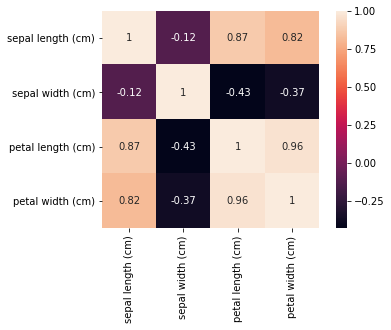

In [4]:
## Matriz de correlacion de las 4 variables
corrmat = df.corr()
sns.heatmap(corrmat, annot = True, square = True)
plt.show()

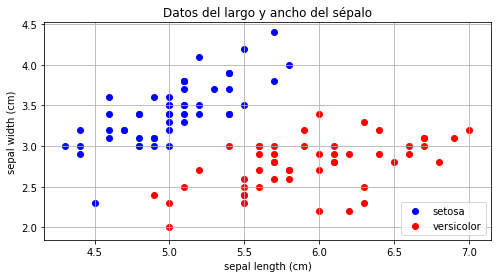

In [5]:
X = data.data
Y = data.target

f1 = 0
f2 = 1

X = X[Y<2,f1:f2+1]
Y = Y[Y<2]

fig, ax = plt.subplots(figsize=(8,4))
line, = ax.plot([],[], 'k-')

plt.title("Datos del largo y ancho del sépalo")
ax.scatter(X[Y==0, 0], X[Y==0,1], c='b', label=data.target_names[0])
ax.scatter(X[Y==1, 0], X[Y==1,1], c='r', label=data.target_names[1])
ax.legend(loc='lower right')

ax.set_xlabel(data.feature_names[f1])
ax.set_ylabel(data.feature_names[f2])

x = np.linspace(ax.get_xlim()[0], ax.get_xlim()[1], 200)
ax.grid(True)

In [6]:
def anima(i):
    y = thetas[i][0] + thetas[i][1] * x
    line.set_data(x,y)
    return line,

In [7]:
df['target'] = data['target']
df["target"] = np.where((df.target==0), 1, -1)
train, test = train_test_split(df, test_size = 0.2, stratify = data['target'], random_state = 42)

In [8]:
def perceptron (data, n_iters):
    """
    Función que implementa el algoritmo Perceptron
    Args:
        data (dataframe): dataframe con los datos a evaluar
        n_iters (int): número de iteraciones a realizar
    Returns:
        theta (array): arreglo con los pesos resultantes de la evaluación
        errors_ (array): arreglo con los errores por cada iteración
    """
    labels = data.iloc[0:,4].values 
    X = data.iloc[0:, 0:2].values 
    theta = np.zeros(1 + X.shape[1])
    errors_ = []
    thetas = []

    for _ in range(n_iters):
        errors = 0
        for xi, label in zip(X, labels):                        
            y = (theta[1:] @ xi) + theta[0]
            target = -1.0 if (y < 0) else 1
            update = label - target
            if update:
                theta[1:] +=  update * xi
                theta[0] += update
                errors += 1
                thetas.append((-theta[0]/theta[2],-theta[1]/theta[2]))
        errors_.append(errors)
        
    return theta, errors_, thetas

In [9]:
n_iters = 100
theta,errors,thetas = perceptron(train,n_iters)
t_ = test.iloc[0:, 0:2].values

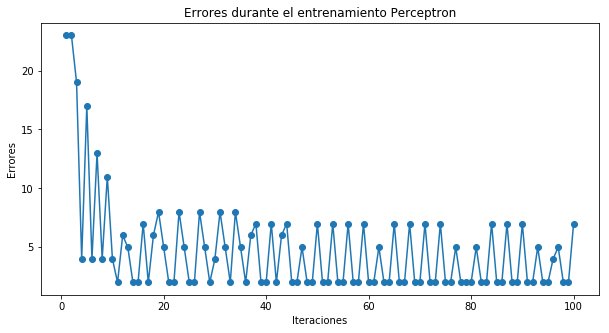

In [10]:
plt.figure(figsize=(10,5)) 
plt.plot(np.arange(1, n_iters+1), errors, marker='o')
plt.xlabel('Iteraciones')
plt.ylabel('Errores')
plt.title("Errores durante el entrenamiento Perceptron")
plt.show()

Probamos el modelo con el resultado del producto punto entre theta y el vector de características del dataset de prueba

In [11]:
y_pred = pd.Series([(theta[1:] @ t_[i] > 0) for i in range (t_.shape[0])]).map({False:-1, True:1 }).values
y_test = test.iloc[0:,4].values
print(f"Theta: {theta[1:]}\n")
print(f"Precisión del modelo con el dataset de prueba: {accuracy_score(y_test,y_pred)}\n")

Theta: [-94.2 142.6]

Precisión del modelo con el dataset de prueba: 0.9



Una vez que implementamos la función hacemos 100 iteraciones para ver cómo se comporta el número de errores a través de éstas. Como se muestra en la gráfica al principio hay un mayor número de errores y al ir avanzando éstos se comienzan a estabilizar, logrando una precisión del modelo al 90%

A continuación se muestra la gráfica animada de cómo se fue entrenando el modelo de perceptrón, moviendo la línea en diferentes posiciones dependiendo de los errores que se generaron en la iteración anterior, hasta lograr encontrar la que mejor clasifique a nuestros datos.

In [12]:
animacion = animation.FuncAnimation(fig, anima, frames=len(thetas), interval=200, blit=True)
HTML(animacion.to_jshtml())